# Weak lensing – Notebook January 2024

In [1]:
%matplotlib inline

import os
import yaml
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.path as mpath
from scipy import ndimage, signal, stats, optimize

from astropy.table import Table
from lenspack.utils import bin2d
from lenspack.image.inversion import ks93, ks93inv

In [2]:
with open('../config.yml', 'r') as file:
    config_data = yaml.safe_load(file)

COSMOS_DIR = os.path.expanduser(config_data['cosmos_dir'])
KTNG_DIR = os.path.expanduser(config_data['ktng_dir'])
BIN_FILE = config_data['bin_file'] # red shift for the simulated convergence maps
PNG_FILE = config_data['png_file'] # to save as PNG

## 2nd to 5th January 2024

### Load COSMOS catalog

*Data available at https://archive.stsci.edu/hlsp/candels/cosmos-catalogs.*

Load data:

In [3]:
# Load data
cat_bright = Table.read(f'{COSMOS_DIR}/cosmos_bright_cat_min.asc', format='ascii')
cat_faint = Table.read(f'{COSMOS_DIR}/cosmos_faint_cat.asc', format='ascii')

Discard galaxies with redshift measurement problem:

In [4]:
cat_bright = cat_bright[cat_bright['z_problem'] == 0]

Merge catalog:

In [5]:
cat_full = Table()
cat_full['Ra'] = np.concatenate([cat_bright['Ra'], cat_faint['Ra']])
cat_full['Dec'] = np.concatenate([cat_bright['Dec'], cat_faint['Dec']])
cat_full['e1iso_rot4_gr_snCal'] = np.concatenate([cat_bright['e1iso_rot4_gr_snCal'], cat_faint['e1iso_rot4_gr_snCal']])
cat_full['e2iso_rot4_gr_snCal'] = np.concatenate([cat_bright['e2iso_rot4_gr_snCal'], cat_faint['e2iso_rot4_gr_snCal']])
cat_full['nhweight_int'] = np.concatenate([cat_bright['nhweight_int'], cat_faint['nhweight_int']])

Create vertices (borders of the COSMOS field):

In [6]:
COSMOS_VERTICES = [(149.508, 2.880),
                   (149.767, 2.836),
                   (149.780, 2.887),
                   (150.040, 2.842),
                   (150.051, 2.893),
                   (150.363, 2.840),
                   (150.376, 2.890),
                   (150.746, 2.826),
                   (150.737, 2.774),
                   (150.790, 2.765),
                   (150.734, 2.449),
                   (150.787, 2.441),
                   (150.730, 2.125),
                   (150.785, 2.118),
                   (150.758, 2.013),
                   (150.768, 2.010),
                   (150.747, 1.910),
                   (150.799, 1.897),
                   (150.740, 1.580),
                   (150.481, 1.625),
                   (150.466, 1.572),
                   (150.211, 1.619),
                   (150.196, 1.567),
                   (149.887, 1.621),
                   (149.872, 1.571),
                   (149.617, 1.615),
                   (149.602, 1.566),
                   (149.493, 1.584),
                   (149.504, 1.637),
                   (149.450, 1.646),
                   (149.488, 1.855),
                   (149.433, 1.862),
                   (149.491, 2.178),
                   (149.436, 2.186),
                   (149.484, 2.445),
                   (149.431, 2.455),
                   (149.508, 2.880)]

### Create clean shear maps from simulated convergence maps

*From the kappaTNG suite of mock weak lensing maps: http://columbialensing.org/.*

In [7]:
width_ori = 1024  # size of the simulated convergence maps (nb pixels)
width = 360 # size of the target convergence maps (nb pixels)
size_ori = 5.0  # opening angle of the simulated convergence maps (deg)
size = size_ori * width / width_ori # opening angle of the target convergence maps (deg)

resolution = size / width * 60. # arcmin/pixel
print(f"Resolution = {resolution:.2f} arcmin/pixel")

Resolution = 0.29 arcmin/pixel


In [8]:
ra = np.median(cat_full['Ra'])
dec = np.median(cat_full['Dec'])
extent = [ra - size/2, ra + size/2, dec - size/2, dec + size/2]

Split convergence maps into 3x3 maps of size 360x360 (with overlaps):

In [9]:
def split_map(kappa, n_samples_per_side):

    step = (width_ori - width) // (n_samples_per_side - 1)
    out = []
    beg_i = 0
    for i in range(n_samples_per_side):
        beg_j = 0
        for j in range(n_samples_per_side):
            subkappa = kappa[beg_i:beg_i+width, beg_j:beg_j+width]
            subkappa = subkappa - np.mean(subkappa) # Center-normalize the convergence map
            out.append(subkappa)
            beg_j += step
        beg_i += step

    return out

Load simulated convergence maps:

In [10]:
ninpimgs = 50
list_of_idx = np.arange(ninpimgs) + 1
vectorized_zfill = np.vectorize(lambda x: str(x).zfill(3))
list_of_idx = vectorized_zfill(list_of_idx)

n_samples_per_side = 3

In [11]:
list_of_kappa = []
vmin = np.inf
vmax = -np.inf
for idx in list_of_idx:
    fname = os.path.join(KTNG_DIR, f"run{idx}", BIN_FILE)
    with open(fname, 'rb') as f:
        dummy = np.fromfile(f, dtype="int32", count=1)
        kappa = np.fromfile(f, dtype="float", count=width_ori*width_ori)
        dummy = np.fromfile(f, dtype="int32", count=1)
    kappa = kappa.reshape((width_ori, width_ori))
    fname_png = os.path.join(KTNG_DIR, f"run{idx}", PNG_FILE)
    list_of_kappa += split_map(kappa, n_samples_per_side)
    vmin = min(vmin, np.min(kappa))
    vmax = max(vmax, np.max(kappa))

Plot the $9$ maps extracted from a random simulation:

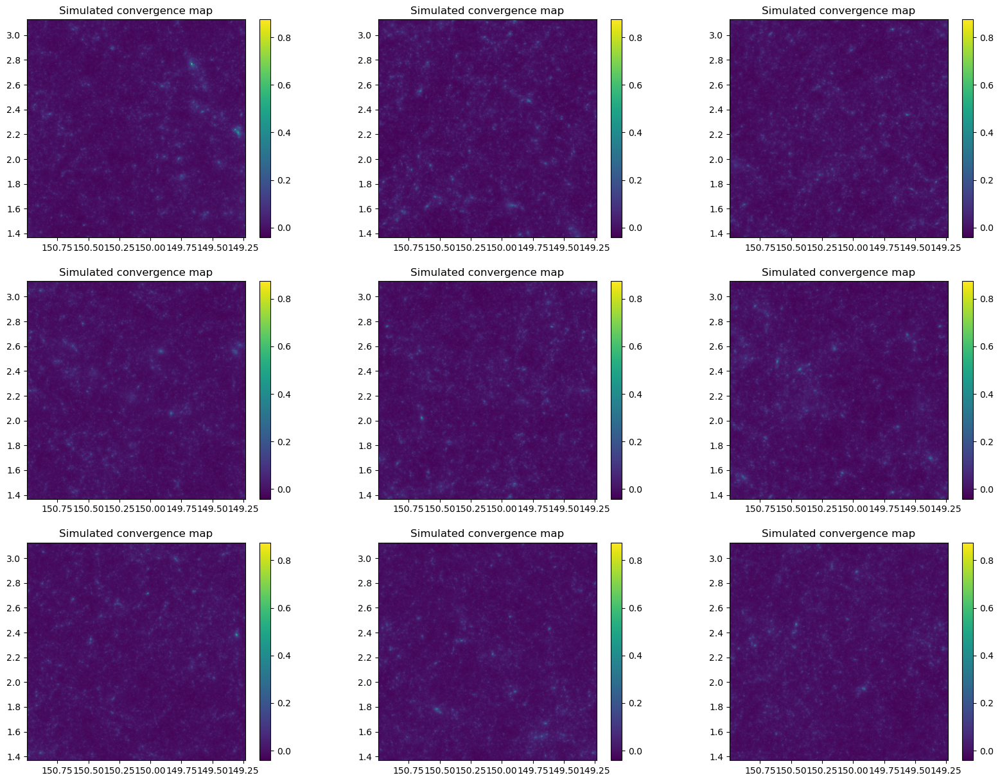

In [12]:
rand_inpimg = np.random.randint(ninpimgs)

plt.figure(figsize=(20, 15))
for i, kappa in enumerate(list_of_kappa[9*rand_inpimg:9*(rand_inpimg+1)]):
    plt.subplot(3, 3, i+1)
    plt.imshow(kappa, origin='lower', vmin=vmin, vmax=vmax, extent=extent) # extent of the COSMOS field
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Simulated convergence map")
plt.show()

Randomly split the convergence maps into calibration and test sets:

In [13]:
nimgs_calib = 100

random.shuffle(list_of_kappa)
kappa_calib = np.stack(list_of_kappa[:nimgs_calib])
kappa_test = np.stack(list_of_kappa[nimgs_calib:])

del list_of_kappa

Create shear maps from the convergence maps:

In [14]:
vectorized_ks93 = np.vectorize(ks93, signature='(n,m),(n,m)->(n,m),(n,m)')
vectorized_ks93inv = np.vectorize(ks93inv, signature='(n,m),(n,m)->(n,m),(n,m)')

In [15]:
nimgs_test = kappa_test.shape[0]
bmode = np.zeros((nimgs_test, width, width)) # no B-mode (convergence maps are real-valued)
gamma1_test, gamma2_test = vectorized_ks93inv(kappa_test, bmode)
gamma2_test = -gamma2_test # use convention from jax_lensing (due to the inversion of the x-axis?)
vmax_gamma = max(
    np.max(gamma1_test), np.max(gamma2_test),
    -np.min(gamma1_test), -np.min(gamma2_test)
)

Plot random convergence maps and corresponding shear maps:

In [16]:
nexamples = 2
saturation = 0.6
rand_idx = np.random.randint(nimgs_test, size=nexamples)

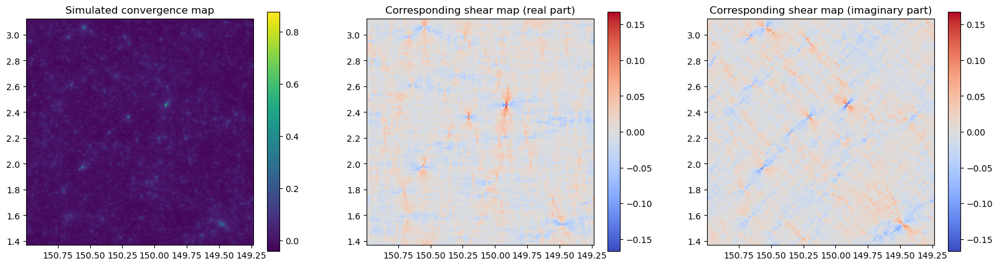

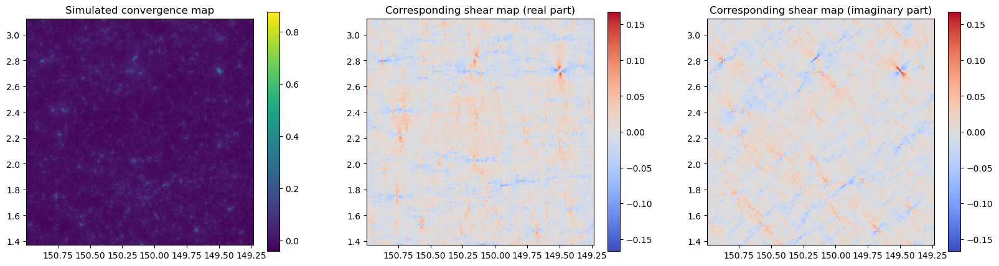

In [17]:
for i, idx in enumerate(rand_idx):
    kappa = kappa_test[idx]
    gamma1, gamma2 = gamma1_test[idx], gamma2_test[idx]

    plt.figure(figsize=(20, 5))

    plt.subplot(131)
    plt.imshow(kappa, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Simulated convergence map")

    plt.subplot(132)
    plt.imshow(
        gamma1, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Corresponding shear map (real part)")

    plt.subplot(133)
    plt.imshow(
        gamma2, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Corresponding shear map (imaginary part)")

    plt.show()

Sanity check: reconstruction of convergence map from clean shear maps:

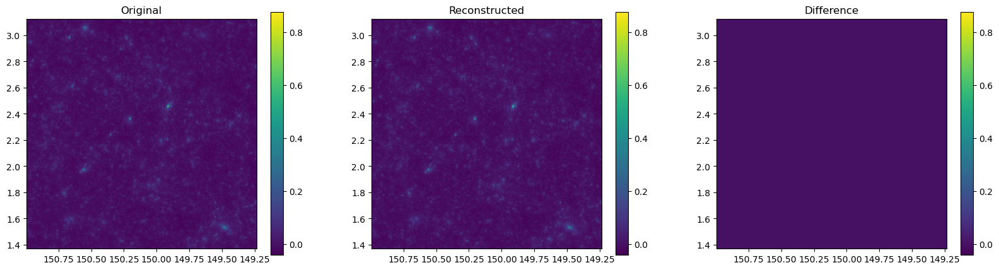

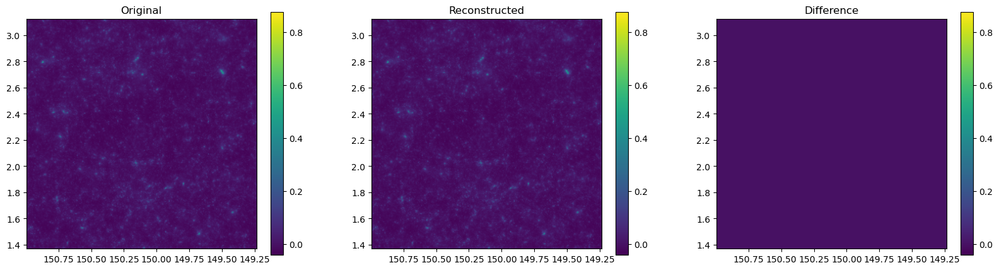

In [18]:
for i, idx in enumerate(rand_idx):
    gamma1, gamma2 = gamma1_test[idx], gamma2_test[idx]
    kappa_ori = kappa_test[idx] # original
    kappa_rec, _ = ks93(gamma1, -gamma2) # reconstructed

    plt.figure(figsize=(20, 5))

    plt.subplot(131)
    plt.imshow(kappa_ori, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Original")

    plt.subplot(132)
    plt.imshow(kappa_rec, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Reconstructed")

    plt.subplot(133)
    plt.imshow(kappa_ori - kappa_rec, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Difference")

    plt.show()

In [19]:
kappa_rec_test, _ = vectorized_ks93(gamma1_test, -gamma2_test)

norm_test = np.linalg.norm(kappa_test, axis=(1, 2))
norm_rec_test = np.linalg.norm(kappa_rec_test, axis=(1, 2))
norm_diff_test = np.linalg.norm(kappa_test - kappa_rec_test, axis=(1, 2))
ratio_test = norm_diff_test / norm_test

print(f"Mean norm for the original convergence maps = {sum(norm_test) / nimgs_test:.2f}")
print(f"Mean norm for the reconstructed convergence maps = {sum(norm_rec_test) / nimgs_test:.2f}")
print(f"Mean norm for the differences = {sum(norm_diff_test) / nimgs_test:.2f}")
print(f"Mean ratio = {sum(ratio_test) / nimgs_test:.1e}")

Mean norm for the original convergence maps = 8.06
Mean norm for the reconstructed convergence maps = 8.06
Mean norm for the differences = 0.11
Mean ratio = 1.3e-02


### Add noise and mask from the COSMOS catalog

*From the jax-lensing repository: https://github.com/CosmoStat/jax-lensing*.

Create a map of number of galaxies per pixel:

In [20]:
n_gal_map_full = bin2d(
    cat_full['Ra'], cat_full['Dec'], npix=width, extent=extent
)
ra, dec = np.array(COSMOS_VERTICES).T

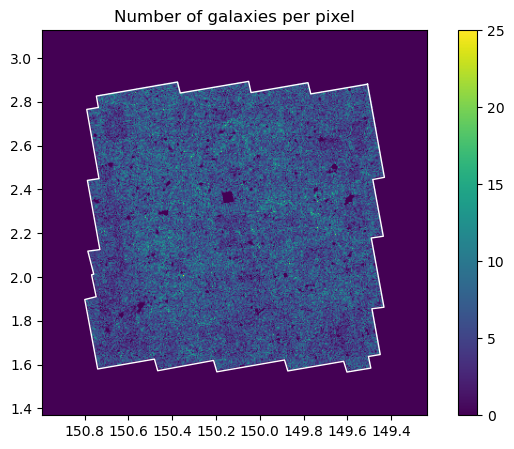

In [21]:
plt.figure(figsize=(8, 5))
plt.imshow(n_gal_map_full, origin='lower', extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.plot(ra, dec,  c='w', lw=1)
plt.title("Number of galaxies per pixel")
plt.show()

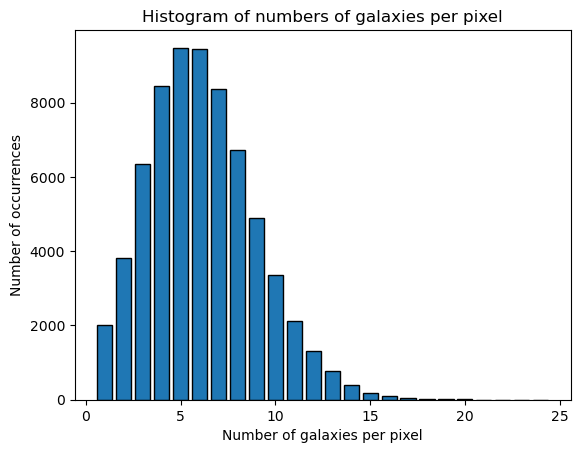

In [22]:
plt.hist(
    n_gal_map_full.flatten(), bins=np.arange(1, n_gal_map_full.max() + 1) - 0.5,
    edgecolor='black', align='mid', rwidth=0.8
)
plt.xlabel('Number of galaxies per pixel')
plt.ylabel('Number of occurrences')
plt.title('Histogram of numbers of galaxies per pixel')
plt.show()

Create binary mask for empty pixels:

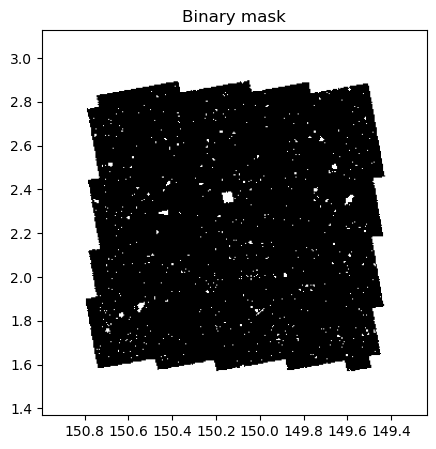

In [23]:
plt.figure(figsize=(5, 5))
mask = (n_gal_map_full == 0)
plt.imshow(mask, cmap='gray', origin='lower', extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1])
plt.title("Binary mask")
plt.show()

Estimate shape dispersion of galaxies:

In [24]:
shapedisp1 = np.std(cat_full['e1iso_rot4_gr_snCal'])
shapedisp2 = np.std(cat_full['e2iso_rot4_gr_snCal'])

print(f"Shape dispersion 1 = {shapedisp1:.3f}")
print(f"Shape dispersion 2 = {shapedisp2:.3f}")

Shape dispersion 1 = 0.305
Shape dispersion 2 = 0.306


- [ ] **Q.** *(2024-01-04)* This measures the shape dispersion including the shear, not the intrinsic shape dispersion...

Add mask to the simulated shear maps:

In [25]:
# Perform elementwise multiplication using broadcasting
gamma1_test = (1 - mask) * gamma1_test
gamma2_test = (1 - mask) * gamma2_test

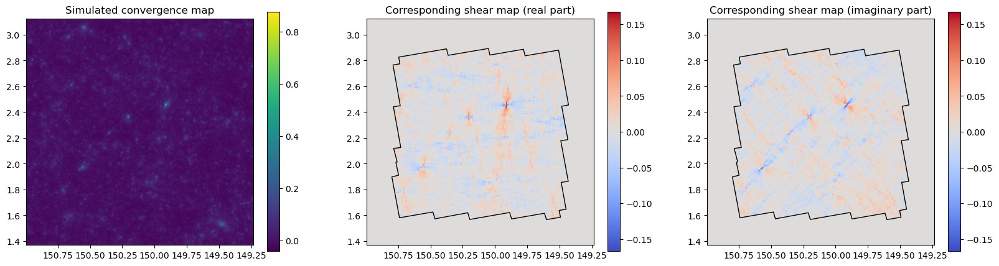

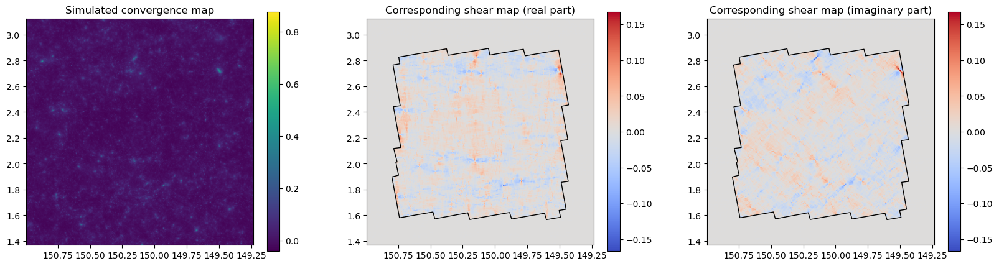

In [26]:
for i, idx in enumerate(rand_idx):
    kappa = kappa_test[idx]
    gamma1, gamma2 = gamma1_test[idx], gamma2_test[idx]

    plt.figure(figsize=(20, 5))

    plt.subplot(131)
    plt.imshow(kappa, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Simulated convergence map")

    plt.subplot(132)
    plt.imshow(
        gamma1, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.plot(ra, dec,  c='k', lw=1)
    plt.title("Corresponding shear map (real part)")

    plt.subplot(133)
    plt.imshow(
        gamma2, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.plot(ra, dec,  c='k', lw=1)
    plt.title("Corresponding shear map (imaginary part)")

    plt.show()

Add noise to the shear maps:

In [27]:
# For masked data, we set in practice a variance which is on the same order of magnitude as the
# maximum values of the simulated convergence maps.
multfact_maxval = 0.8
maxval = np.max(kappa_test)
posinf = multfact_maxval * maxval

shapedisp = (shapedisp1 + shapedisp2) / 2
std = np.nan_to_num(
    shapedisp / np.sqrt(n_gal_map_full), posinf=posinf
)

/tmp/ipykernel_115108/2368764127.py:9: RuntimeWarning: divide by zero encountered in divide
  shapedisp / np.sqrt(n_gal_map_full), posinf=posinf


In [28]:
# Perform elementwise multiplication using broadcasting
noise1 = std * np.random.randn(nimgs_test, width, width)
noise2 = std * np.random.randn(nimgs_test, width, width)

gamma1_noisy_test = gamma1_test + noise1
gamma2_noisy_test = gamma2_test + noise2

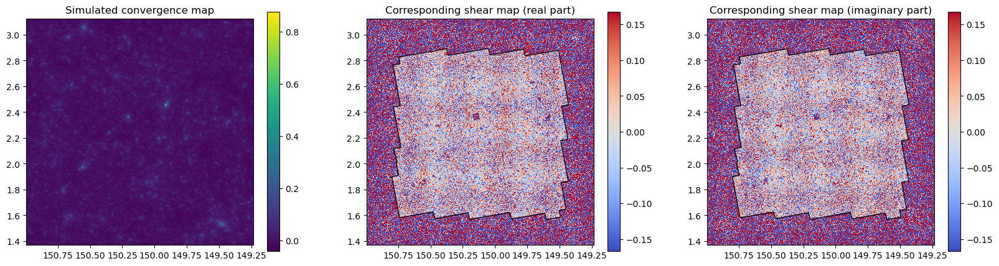

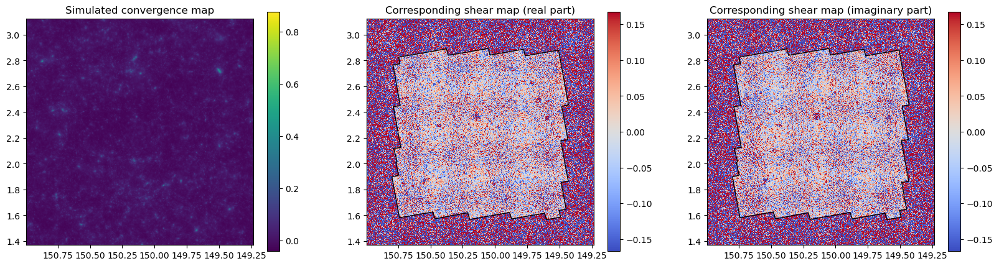

In [29]:
for i, idx in enumerate(rand_idx):
    kappa = kappa_test[idx]
    gamma1, gamma2 = gamma1_noisy_test[idx], gamma2_noisy_test[idx]

    plt.figure(figsize=(20, 5))

    plt.subplot(131)
    plt.imshow(kappa, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Simulated convergence map")

    plt.subplot(132)
    plt.imshow(
        gamma1, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.plot(ra, dec,  c='k', lw=1)
    plt.title("Corresponding shear map (real part)")

    plt.subplot(133)
    plt.imshow(
        gamma2, cmap='coolwarm', origin='lower',
        vmin=-saturation*vmax_gamma, vmax=saturation*vmax_gamma, extent=extent
    )
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.plot(ra, dec,  c='k', lw=1)
    plt.title("Corresponding shear map (imaginary part)")

    plt.show()

### Apply the Kaiser-Squires filter to the noisy shear maps

In [30]:
std_gaussianfilter = 2.

kappa_ks_test, _ = vectorized_ks93(gamma1_noisy_test, -gamma2_noisy_test)
kappa_ks_smoothed_test = ndimage.gaussian_filter(
    kappa_ks_test, std_gaussianfilter, mode="wrap", axes=(1, 2)
)

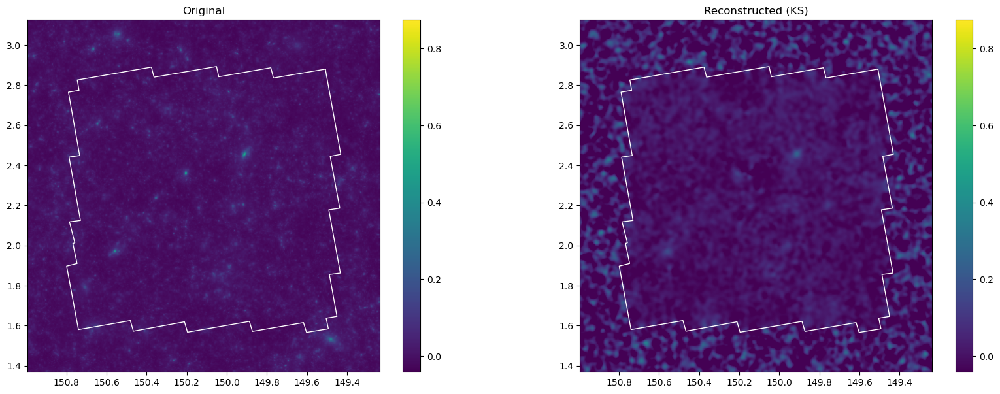

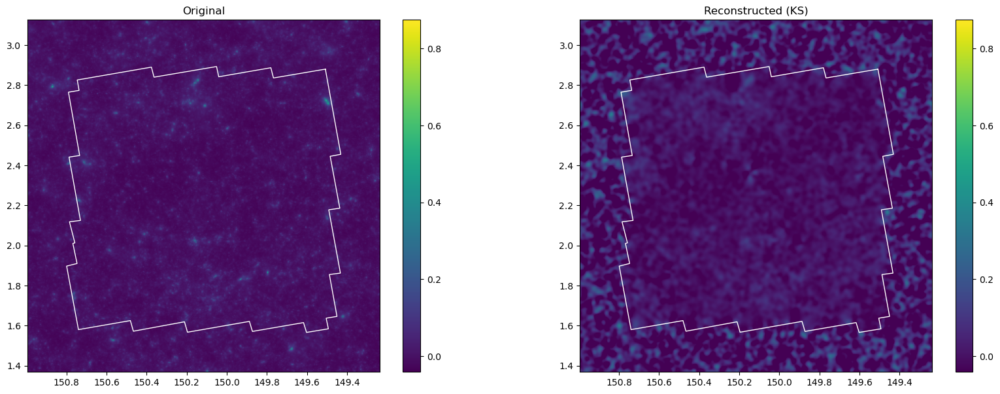

In [31]:
for i, idx in enumerate(rand_idx):
    kappa_ori = kappa_test[idx] # original
    kappa_ks = kappa_ks_test[idx]
    kappa_ks_smoothed = kappa_ks_smoothed_test[idx] # reconstructed

    plt.figure(figsize=(20, 7))

    plt.subplot(121)
    plt.imshow(kappa_ori, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Original")

    plt.subplot(122)
    plt.imshow(kappa_ks_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis  
    plt.colorbar()
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Reconstructed (KS)")

    plt.show()

## 9th January 2024

### Compute lower and upper residuals

Document `uq_mass_map_reconstruction`:

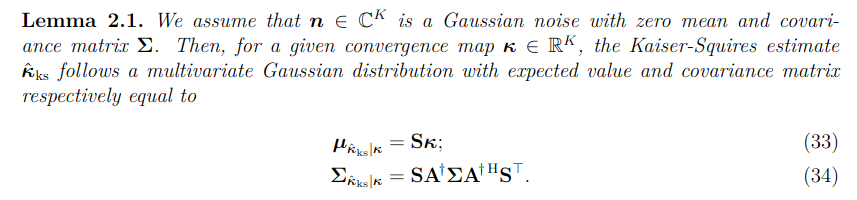

$\boldsymbol\Sigma$ is assumed to be diagonal (uncorrelated noise). Moreover, we are only interested in the diagonal of $\boldsymbol\Sigma_{\hat\kappa | \kappa}$. Then, we can show that
$$
\boldsymbol\Sigma_{\hat\kappa | \kappa}[N p_1 + p_2, N p_1 + p_2] = \sum_{q_1 = 0}^{N-1} \sum_{q_2 = 0}^{N-1} \Bigl|
    \mathbf B[N p_1 + p_2, N q_1 + q_2]
\Bigr|^2 \, \boldsymbol\Sigma[N q_1 + q_2, N q_1 + q_2],
$$
where $N := \sqrt{K}$ denotes the size of the 2D images, and $\mathbf B := \mathbf S \mathbf A^\dagger$.
Besides, one can show that
$$
\mathbf B[N p_1 + p_2,\, N q_1 + q_2] = \mathbf B[N(p_1 - r_1) + (p_2 - r_2),\, N(q_1 - r_1) + (q_2 - r_2)]
$$
for any $r_1,\, r_2$.
Then, by denoting
\begin{align}
    \boldsymbol\sigma[p_1,\, p_2]^2 &:= \boldsymbol\Sigma[N p_1 + p_2, N p_1 + p_2]; \\
    \boldsymbol\sigma_{\hat\kappa | \kappa}[p_1,\, p_2]^2 &:= \boldsymbol\Sigma_{\hat\kappa | \kappa}[N p_1 + p_2, N p_1 + p_2]; \\
    \mathbf b[p_1,\, p_2] &:= \mathbf B[N p_1 + p_2,\, 0],
\end{align}
we get
$$
\boldsymbol\sigma_{\hat\kappa | \kappa}^2 = |\mathbf b|^2 \ast \boldsymbol\sigma^2.
$$

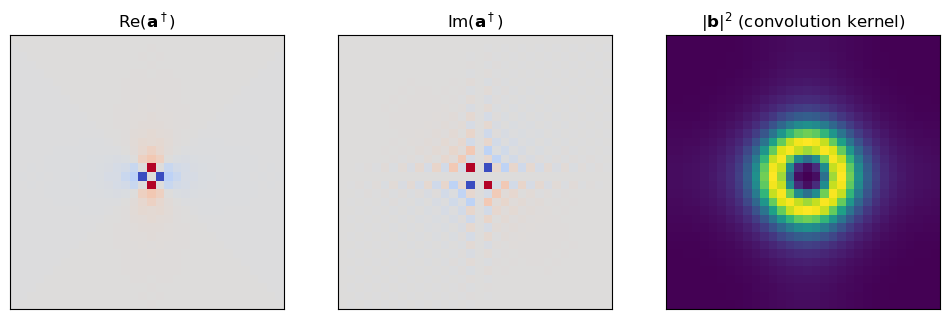

In [32]:
width_test = 32

dirac_real = np.zeros((width_test, width_test))
dirac_real[-1, -1] = 1.

dirac_imag = np.zeros((width_test, width_test))

ksmatr_real, ksmatr_imag = ks93(dirac_real, dirac_imag)
ksmatr_gaussian_real = ndimage.gaussian_filter(ksmatr_real, std_gaussianfilter, mode="wrap")
ksmatr_gaussian_imag = ndimage.gaussian_filter(ksmatr_imag, std_gaussianfilter, mode="wrap")
ksmatr_gaussian_sqmodule = ksmatr_gaussian_real**2 + ksmatr_gaussian_imag**2

ksmatr_real = np.fft.fftshift(ksmatr_real)
ksmatr_imag = np.fft.fftshift(ksmatr_imag)
ksmatr_gaussian_sqmodule = np.fft.fftshift(ksmatr_gaussian_sqmodule)

plt.figure(figsize=(12, 4))

plt.subplot(131)
plt.imshow(ksmatr_real, cmap='coolwarm', origin='lower')
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.xticks([]); plt.yticks([])
plt.title(r"$\text{Re}(\mathbf{a}^\dagger)$")

plt.subplot(132)
plt.imshow(ksmatr_imag, cmap='coolwarm', origin='lower')
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.xticks([]); plt.yticks([])
plt.title(r"$\text{Im}(\mathbf{a}^\dagger)$")

plt.subplot(133)
plt.imshow(ksmatr_gaussian_sqmodule, origin='lower')
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.xticks([]); plt.yticks([])
plt.title(r"$|\mathbf{b}|^2$ (convolution kernel)")

plt.show()

In [33]:
dirac_real = np.zeros((width, width))
dirac_real[-1, -1] = 1.

dirac_imag = np.zeros((width, width))

ksmatr_real, ksmatr_imag = ks93(dirac_real, dirac_imag)
ksmatr_gaussian_real = ndimage.gaussian_filter(ksmatr_real, std_gaussianfilter, mode="wrap")
ksmatr_gaussian_imag = ndimage.gaussian_filter(ksmatr_imag, std_gaussianfilter, mode="wrap")
ksmatr_gaussian_sqmodule = ksmatr_gaussian_real**2 + ksmatr_gaussian_imag**2

ksmatr_gaussian_sqmodule = np.fft.fftshift(ksmatr_gaussian_sqmodule) # for convolution

# Crop convolution kernel for efficiency (fast-decaying coefficients)
crop_width = 32
start = (width - crop_width) // 2
ksmatr_gaussian_sqmodule = ksmatr_gaussian_sqmodule[
    start:start+crop_width, start:start+crop_width
]

std_ks = np.sqrt(signal.convolve2d(std**2, ksmatr_gaussian_sqmodule, mode="same", boundary="wrap"))

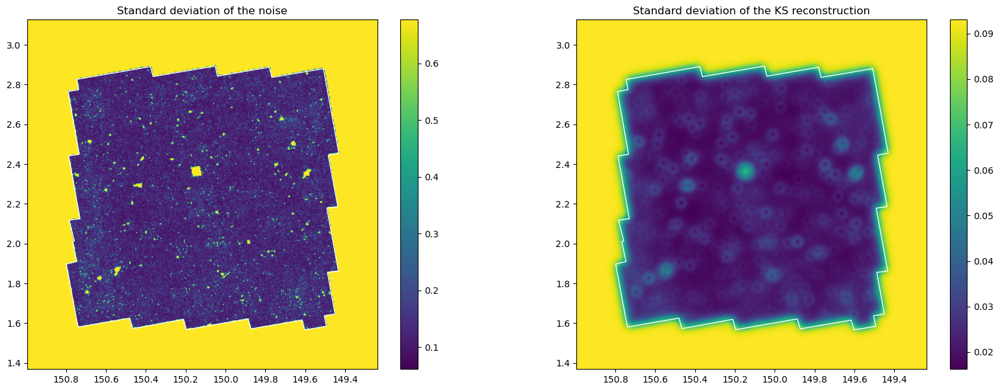

In [34]:
plt.figure(figsize=(20, 7))

plt.subplot(121)
plt.imshow(
    std, origin='lower', extent=extent
)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.plot(ra, dec,  c='w', lw=1)
plt.title("Standard deviation of the noise")

plt.subplot(122)
plt.imshow(
    std_ks, origin='lower', extent=extent
)
plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
plt.colorbar()
plt.plot(ra, dec,  c='w', lw=1)
plt.title("Standard deviation of the KS reconstruction")

plt.show()

Compute lower and upper-residuals. According to the working document `uq_mass_map_reconstruction` (commit nb `bdc51a3dd01e60ef90831456e3f539b20955deda`), we have:

![Capture d’écran du 2024-01-09 18-22-01.png](<attachment:Capture d’écran du 2024-01-09 18-22-01.png>)
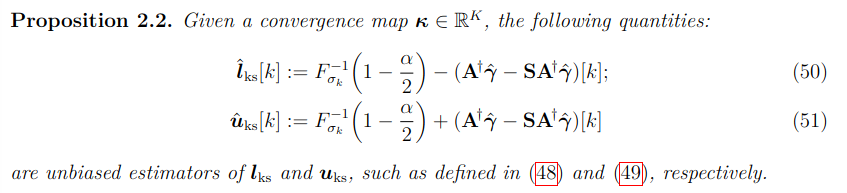

In [35]:
confidence = 2 # Level of confidence (n-sigma)
alpha = 2 - 2 * stats.norm.cdf(confidence)
ppf = confidence * std_ks
print(f"Confidence level of {confidence}-sigma --> alpha = {alpha:.1e}")

Confidence level of 2-sigma --> alpha = 4.6e-02


In [36]:
kappa_ks_diff_test = kappa_ks_test - kappa_ks_smoothed_test
lowerres_test = ppf - kappa_ks_diff_test
upperres_test = ppf + kappa_ks_diff_test

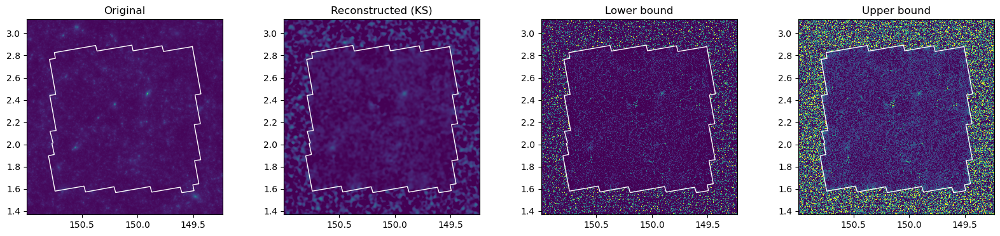

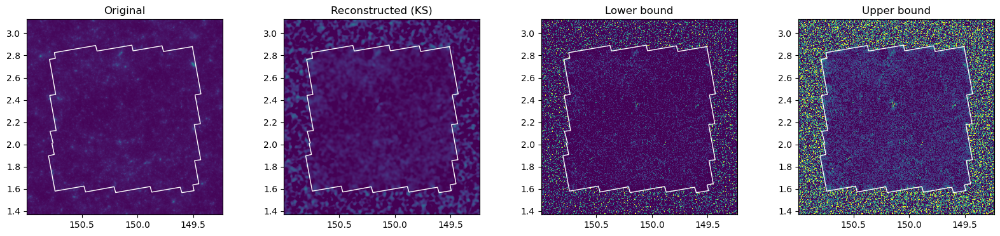

In [37]:
for i, idx in enumerate(rand_idx):
    kappa_ori = kappa_test[idx] # original
    kappa_ks_smoothed = kappa_ks_smoothed_test[idx] # reconstructed
    lowerres = lowerres_test[idx] # lower residual
    upperres = upperres_test[idx] # upper residual

    plt.figure(figsize=(20, 4))

    plt.subplot(141)
    plt.imshow(kappa_ori, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Original")

    plt.subplot(142)
    plt.imshow(kappa_ks_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Reconstructed (KS)")

    plt.subplot(143)
    plt.imshow(kappa_ks_smoothed - lowerres, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Lower bound")

    plt.subplot(144)
    plt.imshow(kappa_ks_smoothed + upperres, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Upper bound")

    plt.show()

## 2024-01-10

### Compute lower and upper residuals (next)

Unfortunately, the estimates of the lower and upper residuals are unbiased but are also very noisy, due to the non-smoothed Kaiser-Squire estimate $\mathbf A^\dagger \hat{\boldsymbol\gamma}$ appearing in the computation of these estimates. They can even be negative, which shouldn't be allowed. Therefore, the estimated lower and upper bounds will undergo huge transformations through calibration, thereby strongly limiting the predictive power of the system.

Instead, I propose to estimate bounds for the smoothed version of the ground truth convergence map. Then, instead of estimating uncertainty of $\mathbf S \mathbf A^\dagger \hat{\boldsymbol\gamma}$ with respect to $\boldsymbol \kappa$, we do so with respect to $\mathbf S \boldsymbol \kappa$. In this context, one can choose the following residuals:
\begin{align}
    l_{ks}[k] = u_{ks}[k] = F^{-1}_{\sigma_k}(1-\alpha/2).
\end{align}

In [38]:
kappa_smoothed_test = ndimage.gaussian_filter(
    kappa_test, std_gaussianfilter, mode="wrap", axes=(1, 2)
)

# Lower and upper residuals (in this context, do not depend on the input)
lowerres = ppf
upperres = ppf

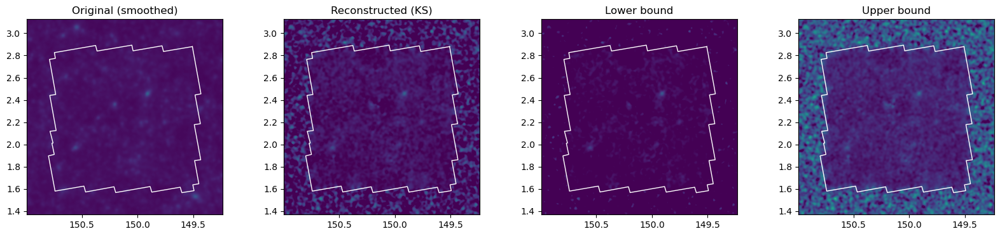

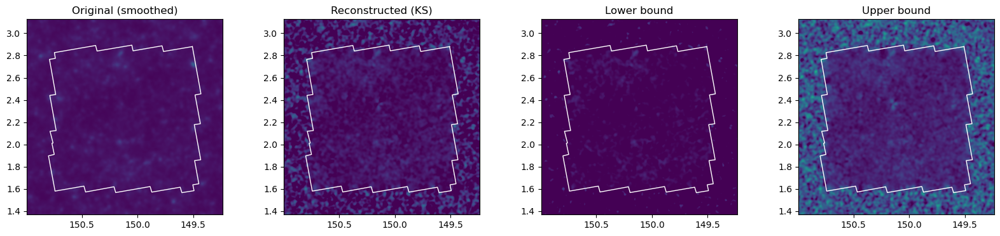

In [39]:
for i, idx in enumerate(rand_idx):
    kappa_ori_smoothed = kappa_smoothed_test[idx] # original
    kappa_ks_smoothed = kappa_ks_smoothed_test[idx] # reconstructed

    plt.figure(figsize=(20, 4))

    plt.subplot(141)
    plt.imshow(kappa_ori_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Original (smoothed)")

    plt.subplot(142)
    plt.imshow(kappa_ks_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Reconstructed (KS)")

    plt.subplot(143)
    plt.imshow(kappa_ks_smoothed - lowerres, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Lower bound")

    plt.subplot(144)
    plt.imshow(kappa_ks_smoothed + upperres, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Upper bound")

    plt.show()

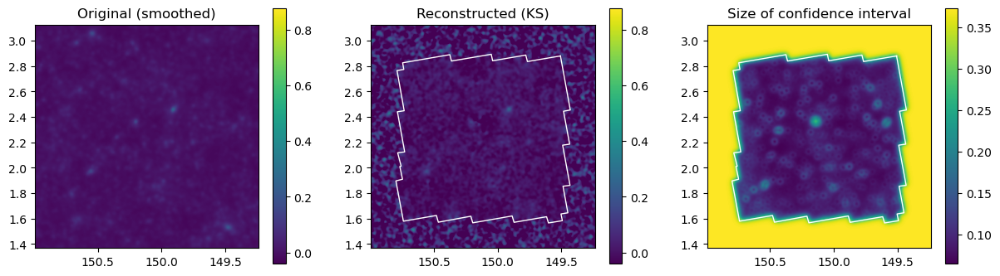

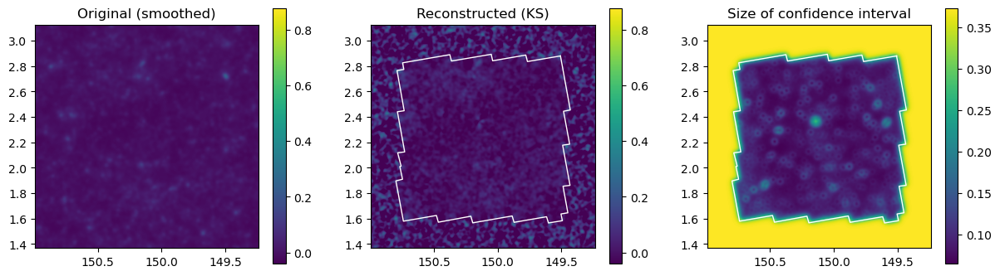

In [40]:
for i, idx in enumerate(rand_idx):
    kappa_ori_smoothed = kappa_smoothed_test[idx] # original
    kappa_ks_smoothed = kappa_ks_smoothed_test[idx] # reconstructed

    plt.figure(figsize=(20, 4))

    plt.subplot(141)
    plt.imshow(kappa_ori_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.colorbar()
    plt.title("Original (smoothed)")

    plt.subplot(142)
    plt.imshow(kappa_ks_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.colorbar()
    plt.title("Reconstructed (KS)")

    plt.subplot(143)
    plt.imshow(upperres + lowerres, origin='lower', extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.colorbar()
    plt.title("Size of confidence interval")

    plt.show()

### Accuracy of the prediction intervals

We will measure this accuracy within the COSMOS boundaries.

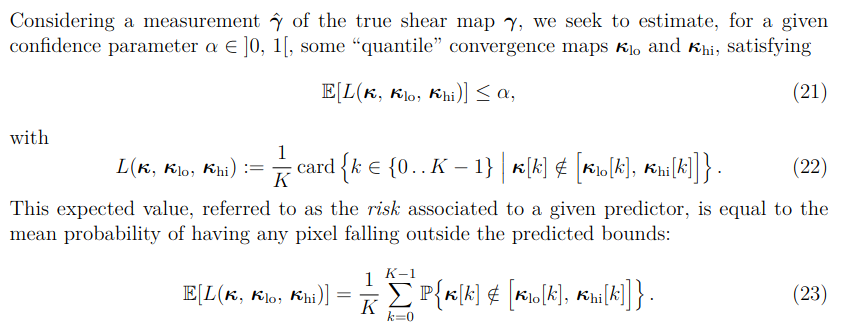

Define the loss function:

In [41]:
# Use **kwargs for argument `axis`, for instance
def loss(kappa, kappa_lo, kappa_hi, mask, **kwargs):
    ill_predicted = (kappa < kappa_lo) | (kappa > kappa_hi)
    ill_predicted *= mask
    return np.sum(ill_predicted, **kwargs) / np.sum(mask)

Create binary mask to exclude the regions outside the COSMOS boundaries:

In [42]:
# Map the COSMOS_VERTICES to pixel coordinates
pixel_vertices = [(
    int((vertex[0] - extent[0]) / (extent[1] - extent[0]) * width),
    int((vertex[1] - extent[2]) / (extent[3] - extent[2]) * width)
) for vertex in COSMOS_VERTICES]

# Create a path from the pixel coordinates
cosmos_path = mpath.Path(pixel_vertices)

# Create a grid of coo_smoothedrdinates
x, y = np.meshgrid(np.arange(width), np.arange(width))

# Flatten the grid coordinates
x_flat, y_flat = x.flatten(), y.flatten()

# Stack the flattened coordinates to create an array of (x, y) pairs
points = np.column_stack((x_flat, y_flat))

# Check if each point is inside the defined path
cosmos_mask = cosmos_path.contains_points(points)

# Reshape the mask to the original grid shape
cosmos_mask = cosmos_mask.reshape((width, width))

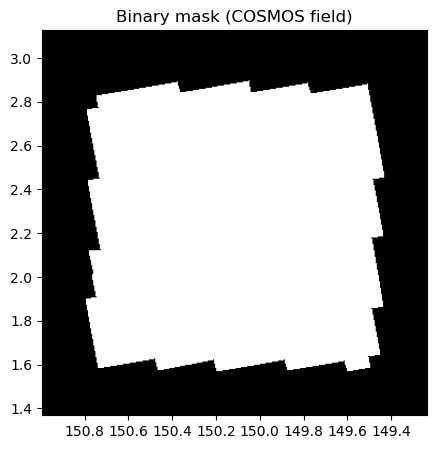

In [43]:
plt.figure(figsize=(5, 5))
plt.imshow(cosmos_mask, cmap='gray', origin='lower', extent=extent)
plt.xlim(plt.gca().get_xlim()[::-1])
plt.title("Binary mask (COSMOS field)")
plt.show()

In [44]:
kappa_lo_smoothed_test = kappa_ks_smoothed_test - lowerres
kappa_hi_smoothed_test = kappa_ks_smoothed_test + upperres
losses_test = loss(
    kappa_smoothed_test, kappa_lo_smoothed_test, kappa_hi_smoothed_test, cosmos_mask,
    axis=(1, 2)
)

print(f"Mean value = {np.mean(losses_test):.1e}")
print(f"Standard deviation = {np.std(losses_test):.1e}")
print(f"Target = {alpha:.1e}")

Mean value = 6.3e-02
Standard deviation = 5.6e-03
Target = 4.6e-02


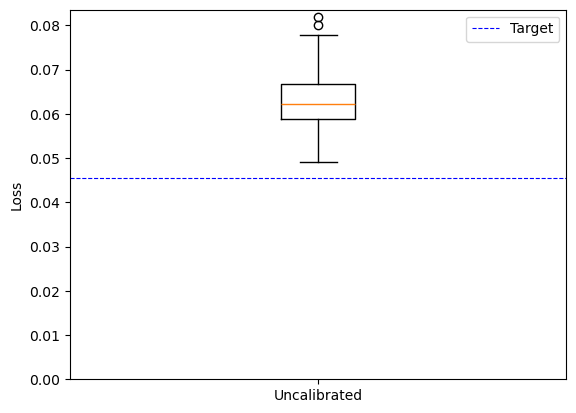

In [45]:
plt.boxplot(losses_test)
plt.ylim(bottom=0.)
plt.xticks([1], ["Uncalibrated"])
plt.ylabel("Loss")
plt.axhline(y=alpha, color='blue', linestyle='--', linewidth=0.8, label='Target')
plt.legend()
plt.show()

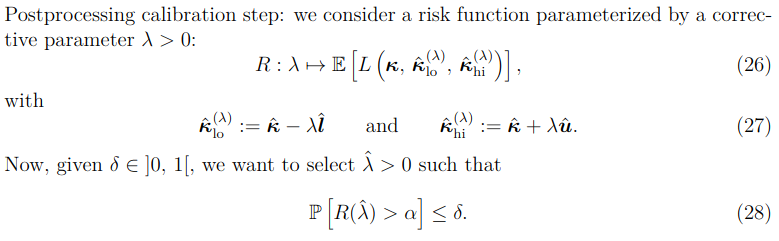

With a target confidence of $4\sigma$, in absence of calibration ($\lambda := 1$), we have $R(1) \approx 2 \cdot 10^{-4} > \alpha$ (estimated on the test set, which contains $350$ inputs). We want to calibrate the bounds such that this situation will only occur with probability $\delta$, for a given $\delta \in ]0,\, 1[$.

Statistics on the confidence intervals:

In [46]:
confinterv = (upperres + lowerres)[cosmos_mask]

print(f"Mean value = {np.mean(confinterv):.2f}")
print(f"Standard deviation = {np.std(confinterv):.2f}")

Mean value = 0.10
Standard deviation = 0.04


### Risk-controlling-based calibration

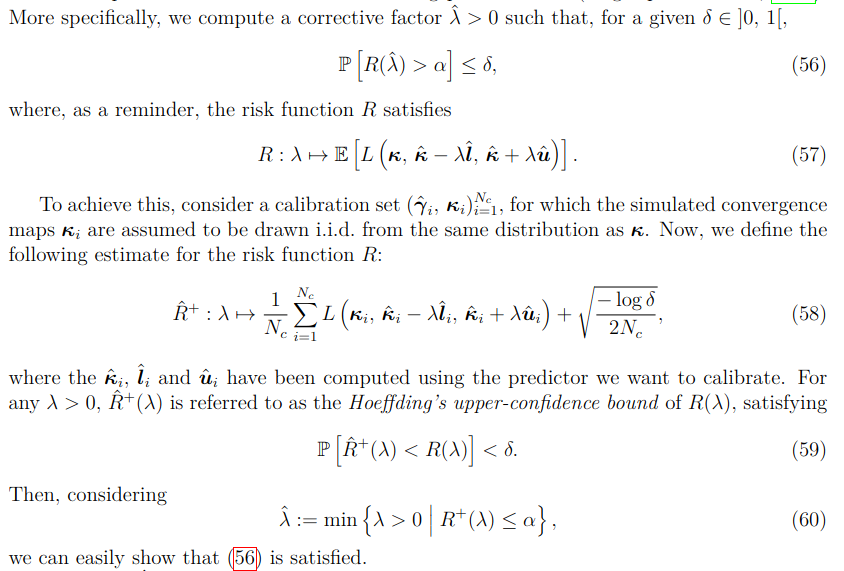

From A. N. Angelopoulos et al., “Image-to-Image Regression with Distribution-Free Uncertainty Quantification and Applications in Imaging,” in Proceedings of the 39th International Conference on Machine Learning, PMLR, Jun. 2022, pp. 717–730:

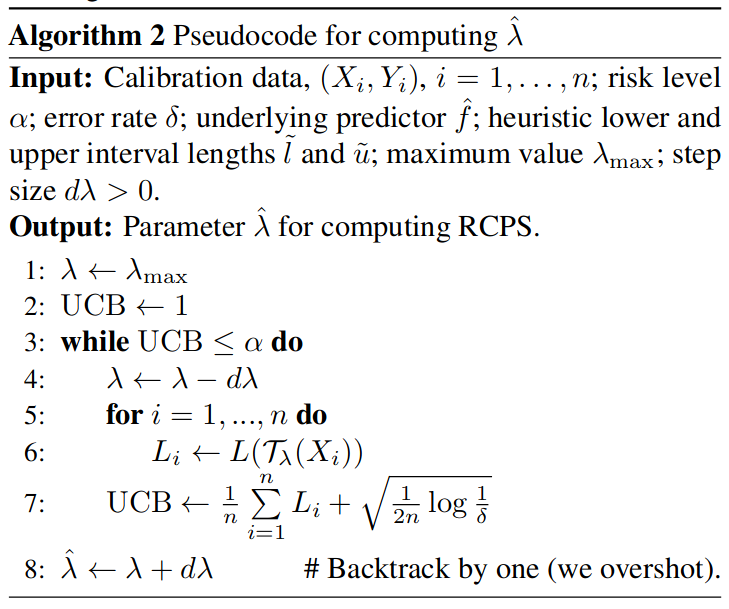

Code adapted from https://github.com/aangelopoulos/im2im-uq.git

In [47]:
def h1(y, mu):
    return y*np.log(y/mu) + (1-y)*np.log((1-y)/(1-mu))

### Log tail inequalities of mean
def hoeffding_plus(mu, x, n):
    return -n * h1(np.minimum(mu,x),mu)

def bentkus_plus(mu, x, n):
    return np.log(max(stats.binom.cdf(np.floor(n*x),n,mu),1e-10))+1

### UCB of mean via Hoeffding-Bentkus hybridization
def HB_mu_plus(muhat, n, delta, maxiters=1000):
    def _tailprob(mu):
        hoeffding_mu = hoeffding_plus(mu, muhat, n)
        bentkus_mu = bentkus_plus(mu, muhat, n)
        return min(hoeffding_mu, bentkus_mu) - np.log(delta)
    muhat = max(muhat, 1e-10) # line added to avoid divisions by zero
    if _tailprob(1-1e-10) > 0:
        return 1
    else:
        try:
          return optimize.brentq(_tailprob, muhat, 1-1e-10, maxiter=maxiters)
        except:
          print(f"BRENTQ RUNTIME ERROR at muhat={muhat}")
          return 1.0

In [48]:
def _get_min_alpha(nimgs_calib, delta):
    return HB_mu_plus(0., nimgs_calib, delta)


def _get_min_nimgs_calib(alpha, delta, init_nimgs=100):

    lower_nimgs = 0
    upper_nimgs = np.inf
    nimgs = init_nimgs
    while True:
        min_alpha = _get_min_alpha(nimgs, delta)
        if alpha < min_alpha: # nimgs is too small
            lower_nimgs = nimgs
            if upper_nimgs == np.inf:
                nimgs *= 2
            elif upper_nimgs == nimgs + 1:
                nimgs = upper_nimgs
                break
            else:
                nimgs += (upper_nimgs - nimgs) // 2
        
        else: # nimgs is too large or just the same size
            upper_nimgs = nimgs
            if lower_nimgs == nimgs - 1:
                break
            else:
                nimgs -= (nimgs - lower_nimgs) // 2

    return nimgs


def _get_min_delta(alpha, nimgs_calib, min_ddelta=1e-6):

    min_alpha_ever = _get_min_alpha(nimgs_calib, 1.)
    if alpha < min_alpha_ever:
        raise ValueError("No admissible value for delta")

    lower_delta = 0.
    upper_delta = 1.
    ddelta = 1.
    delta = 0.5
    while True:
        min_alpha = _get_min_alpha(nimgs_calib, delta)
        if alpha < min_alpha: # delta is too small
            lower_delta = delta
            if ddelta <= min_ddelta: # smallest interval reached
                nimgs = upper_delta
                break
            else:
                ddelta = (upper_delta - delta) / 2
                delta += ddelta
        
        else: # delta is too large or just the same size
            upper_delta = delta
            if ddelta <= min_ddelta: # smallest interval reached
                break
            else:
                ddelta = (delta - lower_delta) / 2
                delta -= ddelta

    return delta

In [49]:
def _get_losses(
        groundtruth, prediction, lowerres, upperres, mask, lam
):
    lower_edge = prediction - lam * lowerres
    upper_edge = prediction + lam * upperres
    lower_edge = np.minimum(lower_edge, prediction - 1e-6)
    upper_edge = np.maximum(upper_edge, prediction + 1e-6)

    out = loss(groundtruth, lower_edge, upper_edge, mask, axis=(1, 2))

    return out


def calibrate(
        groundtruth_calib, predictionimgs_calib, lowerres_calib, upperres_calib,
        alpha, delta, init_lam, min_dlambda, mask
):
    nimgs, width1, width2 = groundtruth_calib.shape
    assert predictionimgs_calib.shape == (nimgs, width1, width2)
    for arr in (lowerres_calib, upperres_calib):
        assert arr.shape == (nimgs, width1, width2) or arr.shape == (width1, width2)

    # Check whether there is an admissible solution
    min_alpha = _get_min_alpha(nimgs, delta)
    if alpha < min_alpha:
        min_nimgs = _get_min_nimgs_calib(alpha, delta)
        msg = (
            f"The solution cannot be calibrated.\n"
            f"Set alpha to at least {min_alpha:.1e}, or "
            f"increase the size of the calibration to at least {min_nimgs}"
        )
        try:
            min_delta = _get_min_delta(alpha, nimgs)
        except ValueError:
            msg += "."
        else:
            msg += (
                f", or set delta to at least {min_delta:.1e}."
            )
        raise ValueError(msg)

    lower_lam = 0.
    upper_lam = np.inf
    lam = init_lam
    dlambda = np.inf

    while True:
        losses = _get_losses(
            groundtruth_calib, predictionimgs_calib, lowerres_calib, upperres_calib,
            mask, lam
        )
        Rhat = losses.mean()
        RhatPlus = HB_mu_plus(Rhat, nimgs, delta)
        print((
            f"\rDelta: {delta:.1e}  |  Lambda: {lam:.2f}  |  Rhat: {Rhat:.1e}  |  "
            f"RhatPlus: {RhatPlus:.1e}  "
        ), end='')
        if Rhat >= alpha or RhatPlus > alpha: # overconfident: lambda is correct or too small
            lower_lam = lam
            if upper_lam == np.inf:
                lam *= 2
            elif dlambda <= min_dlambda: # smallest interval reached
                break
            else:
                dlambda = (upper_lam - lam) / 2
                lam += dlambda
        
        else: # underconfident: lambda is too large
            upper_lam = lam
            if dlambda <= min_dlambda: # smallest interval reached
                lam = lower_lam
                break
            else:
                dlambda = (lam - lower_lam) / 2
                lam -= dlambda

    print()

    return lam

## 2024-01-12

### Risk-controlling-based calibration (next)

Let's compare:
- the calculation of the Hoeffding bound such as described in A. N. Angelopoulos et al., “Image-to-Image Regression with Distribution-Free Uncertainty Quantification and Applications in Imaging,” in Proceedings of the 39th International Conference on Machine Learning, PMLR, Jun. 2022, pp. 717–730 ("naive" estimation);
- the calculation of the bound using Hoeffding-Bentkus hybridization, such as implemented in https://github.com/aangelopoulos/im2im-uq.git


In [50]:
def naive_hoeffding(muhat, n, delta):
    out = muhat + np.sqrt(-np.log(delta)/(2*n))
    out = np.minimum(out, 1.) # Should return a probability, therefore, should not be greater than 1
    return out

vectorized_HB_mu_plus = np.vectorize(HB_mu_plus, excluded=['n', 'delta'])

In [51]:
delta = alpha
Rhat = np.linspace(0., 1., 501)
RhatPlusNaive = naive_hoeffding(Rhat, nimgs_calib, delta)
RhatPlus = vectorized_HB_mu_plus(Rhat, nimgs_calib, delta)

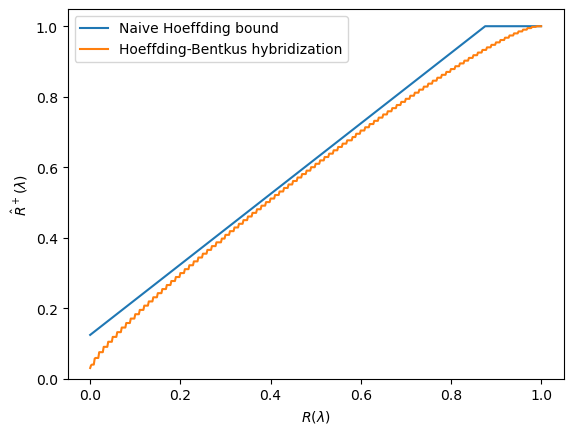

In [52]:
plt.plot(Rhat, RhatPlusNaive, label="Naive Hoeffding bound")
plt.plot(Rhat, RhatPlus, label="Hoeffding-Bentkus hybridization")
plt.ylim(bottom=0)
plt.xlabel(r"$R(\lambda)$")
plt.ylabel(r"$\hat R^+(\lambda)$")
plt.legend()
plt.show()

Therefore, the naive estimation may be too conservative, especially for small or large values of $R(\lambda)$.

Prepare the calibration set:

In [53]:
# Compute clean shear maps from the convergence maps
bmode = np.zeros((nimgs_calib, width, width))
gamma1_calib, gamma2_calib = vectorized_ks93inv(kappa_calib, bmode)
gamma2_calib = -gamma2_calib # use convention from jax_lensing (due to the inversion of the x-axis?)

# Set masked values to 0
gamma1_calib = (1 - mask) * gamma1_calib
gamma2_calib = (1 - mask) * gamma2_calib

# Add noise to the shear maps
noise1 = std * np.random.randn(nimgs_calib, width, width)
noise2 = std * np.random.randn(nimgs_calib, width, width)

gamma1_noisy_calib = gamma1_calib + noise1
gamma2_noisy_calib = gamma2_calib + noise2

Compute predictions from the noisy shear maps:

In [54]:
# Prediction with Kaiser-Squires filter
kappa_ks_calib, _ = vectorized_ks93(gamma1_noisy_calib, -gamma2_noisy_calib)

# Smoothen convergence maps
kappa_smoothed_calib = ndimage.gaussian_filter(
    kappa_calib, std_gaussianfilter, mode="wrap", axes=(1, 2)
)
kappa_ks_smoothed_calib = ndimage.gaussian_filter(
    kappa_ks_calib, std_gaussianfilter, mode="wrap", axes=(1, 2)
)

Calibrate the bounds:

In [55]:
init_lam = 2.
min_dlambda = 1e-6
deltas = np.linspace(alpha, 0.2, 10)
lambdas_calib = []
for delta in deltas:
    lambdas_calib.append(calibrate(
        kappa_smoothed_calib, kappa_ks_smoothed_calib, lowerres, upperres,
        alpha, delta, init_lam, min_dlambda, mask
    ))

Delta: 4.6e-02  |  Lambda: 1.33  |  Rhat: 1.0e-02  |  RhatPlus: 5.7e-02  
Delta: 6.3e-02  |  Lambda: 1.33  |  Rhat: 1.0e-02  |  RhatPlus: 5.3e-02  
Delta: 8.0e-02  |  Lambda: 1.33  |  Rhat: 1.0e-02  |  RhatPlus: 5.1e-02  
Delta: 9.7e-02  |  Lambda: 1.33  |  Rhat: 1.0e-02  |  RhatPlus: 4.8e-02  
Delta: 1.1e-01  |  Lambda: 1.33  |  Rhat: 1.0e-02  |  RhatPlus: 4.6e-02  
Delta: 1.3e-01  |  Lambda: 1.33  |  Rhat: 1.0e-02  |  RhatPlus: 4.6e-02  
Delta: 1.5e-01  |  Lambda: 1.31  |  Rhat: 1.1e-02  |  RhatPlus: 4.6e-02  
Delta: 1.7e-01  |  Lambda: 1.20  |  Rhat: 2.0e-02  |  RhatPlus: 4.4e-02  
Delta: 1.8e-01  |  Lambda: 1.20  |  Rhat: 2.0e-02  |  RhatPlus: 4.3e-02  
Delta: 2.0e-01  |  Lambda: 1.20  |  Rhat: 2.0e-02  |  RhatPlus: 4.2e-02  


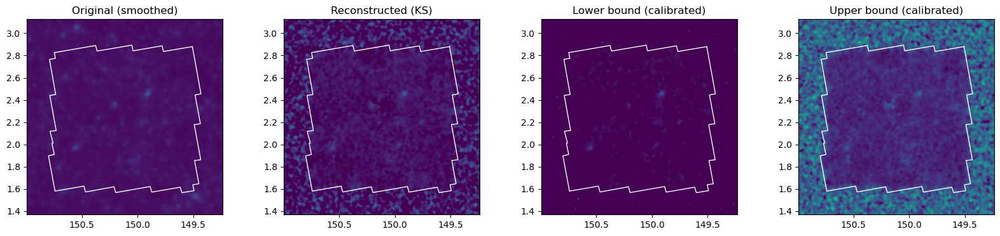

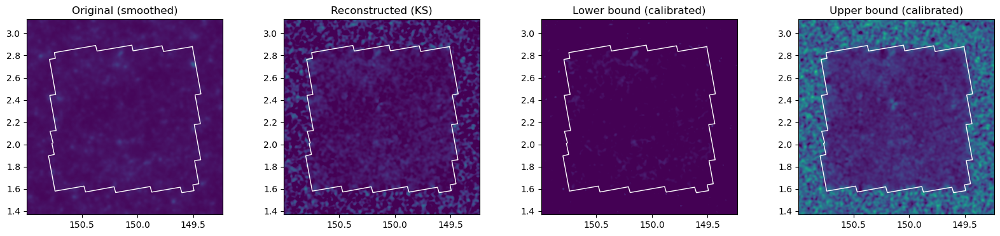

In [56]:
lambda_calib = lambdas_calib[0]
for i, idx in enumerate(rand_idx):
    kappa_ori_smoothed = kappa_smoothed_test[idx] # original
    kappa_ks_smoothed = kappa_ks_smoothed_test[idx] # reconstructed

    plt.figure(figsize=(20, 4))

    plt.subplot(141)
    plt.imshow(kappa_ori_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Original (smoothed)")

    plt.subplot(142)
    plt.imshow(kappa_ks_smoothed, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Reconstructed (KS)")

    plt.subplot(143)
    plt.imshow(kappa_ks_smoothed - lambda_calib * lowerres, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Lower bound (calibrated)")

    plt.subplot(144)
    plt.imshow(kappa_ks_smoothed + lambda_calib * upperres, origin='lower', vmin=vmin, vmax=vmax, extent=extent)
    plt.xlim(plt.gca().get_xlim()[::-1]) # Flip x-axis
    plt.plot(ra, dec,  c='w', lw=1)
    plt.title("Upper bound (calibrated)")

    plt.show()

Get results on the test set:

In [57]:
list_of_losses_test = [losses_test]
for lambda_calib in lambdas_calib:
    kappa_lo_smoothed_calib_test = kappa_ks_smoothed_test - lambda_calib * lowerres
    kappa_hi_smoothed_calib_test = kappa_ks_smoothed_test + lambda_calib * upperres
    list_of_losses_test.append(loss(
        kappa_smoothed_test, kappa_lo_smoothed_calib_test, kappa_hi_smoothed_calib_test, cosmos_mask,
        axis=(1, 2)
    ))

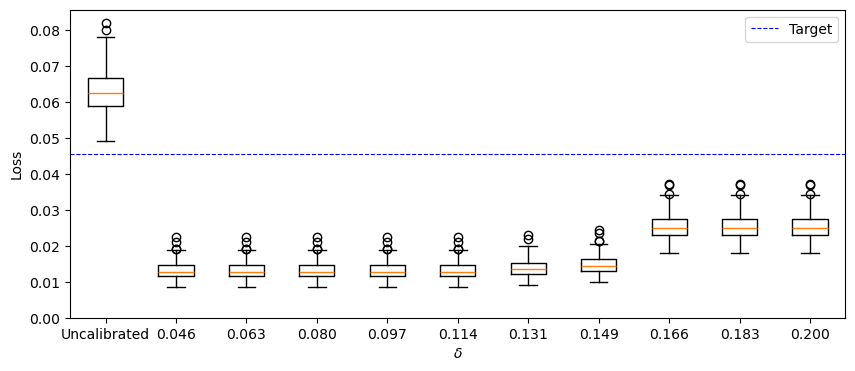

In [58]:
xticklabels = ["Uncalibrated"]
xticklabels += [f"{delta:.3f}" for delta in deltas]

plt.figure(figsize=(10, 4))
plt.boxplot(list_of_losses_test)
plt.ylim(bottom=0.)
plt.xticks(range(1, 12), xticklabels)
plt.xlabel(r"$\delta$")
plt.ylabel("Loss")
plt.axhline(y=alpha, color='blue', linestyle='--', linewidth=0.8, label='Target')
plt.legend()
plt.show()

The results are very conservative, especially for small value of $\delta$, for which the probability of miscalibration (due to statistical fluctuations in the calibration set) is very low. Increasing the size of the calibration set leads to decreasing the risk of miscalibration, thereby limiting overcoverage.

It could also be interesting to apply the conformal prediction approach by Romano et al. (2019), because it explicitly avoids overcoverage.